## Possible solution: Fit polynomial to the power or envelope

In [68]:
from tkinter import filedialog
import tkinter as tk
import numpy as np
import mne
import EegPreprocessor as preprocessor
import matplotlib.pyplot as plt
import sim_data as sd

In [69]:
print(__doc__)


DEFAULT_EOG = ['EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG5', 'EXG6', 'EXG7', 'EXG8']


def get_raw_data_file_path():
    root = tk.Tk()
    root.withdraw()
    data_file_path  = filedialog.askopenfilename()
    return data_file_path


#Channel position function for Biosemi machine
def load_biosemi_montage(string = 'biosemi64'):
    montage = mne.channels.make_standard_montage(string)
    return montage


#Loading the raw data
def load_raw_data(filepath, montage, eog = DEFAULT_EOG):
    raw = mne.io.read_raw_bdf(filepath, montage, eog, preload =True)
    return raw


def preprocess_raw_data():
    print("Please enter the raw data file")
    filepath = get_raw_data_file_path()    
    montage = load_biosemi_montage()
    raw = load_raw_data(filepath, montage)            
    return raw

Automatically created module for IPython interactive environment


In [70]:
# let's explore some frequency bands
iter_freqs = [
    ('Theta', 4, 7),
    ('Alpha', 8, 12),
    ('Beta', 13, 25),
    ("Gamma", 30, 75)
]

# set epoching parameters
event_id = {'1-back_spatial': 10, '2-back_spatial': 20, '3-back_spatial': 30, '1-back_nonspatial': 40,
            '2-back_nonspatial': 50, '3-back_nonspatial': 60}

tmin, tmax = -1.,4.5
baseline = None
raw = preprocess_raw_data()


Please enter the raw data file
Extracting EDF parameters from C:\Users\J_CHOWD\Desktop\Project_CAE\data_format_BDF\DATA_bdf_format\BDF\2019-05-03-suject-01-realTask_merged_One_fourth.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 705535  =      0.000 ...  1377.998 secs...


<ipython-input-69-39b0b2598e54>:22: DeprecationWarning: The `montage` parameter from `read_raw_edf` is deprecated and will be removed  in version 0.20. Use  raw.set_montage(montage) instead.
  raw = mne.io.read_raw_bdf(filepath, montage, eog, preload =True)


In [29]:
frequency_map = list()

for band, fmin, fmax in iter_freqs:
    # (re)load the data to save memory
    raw.load_data()    
    raw.filter(0.1, 100.0, fir_design='firwin')
    raw.notch_filter(np.arange(60, 241, 60), fir_design='firwin')
    events = mne.find_events(raw, shortest_event=0, stim_channel='Status')

    picks = mne.pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False,
                       exclude='bads')

    # Read epochs
    # Testing will be done with a running classifier
    epochs = mne.Epochs(raw, events, event_id, tmin, tmax, proj=True, picks=picks,
                            baseline=None, preload=True)
    # remove evoked response and get analytic signal (envelope)
    epochs.subtract_evoked()  # for this we need to construct new epochs.
    epochs = mne.EpochsArray(data=np.abs(epochs.get_data()), info=epochs.info, tmin=epochs.tmin)
    # now average and move on
    frequency_map.append(((band, fmin, fmax), epochs))

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 25.00 Hz (-6 dB cutoff frequency: 112.50 Hz)
- Filter length: 16897 samples (33.002 sec)

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3379 samples (6.600 sec)

Trigger channel has a non-zero initial value of 655

## Gamma band (high) as 30-75 Hz frequency band: The main frequency of interest

In [30]:
gamma_data = frequency_map[3][1]
gamma_sim = sd.make_sim_data(gamma_data, order=17)


C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

277 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated


C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

0 bad epochs dropped


C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

277 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

277 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated


C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

0 bad epochs dropped


C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

277 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated


C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  sim_data = _make_sim_data_epochs(data, baseline=baseline, order=order)
C:\Users\J_CHOWD\sim_data.py:26: RankWarning: Polyfit may be poorly conditioned
  

0 bad epochs dropped


Average Gamma band 30-75 Hz in simulated N-back data


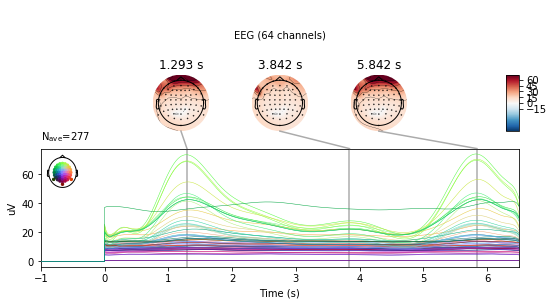

Average Gamma band 30-75 Hz in N-back data


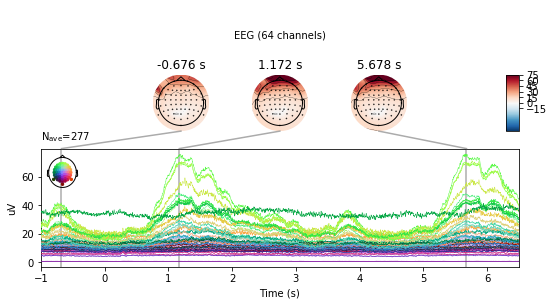

The difference between the simulated and real data


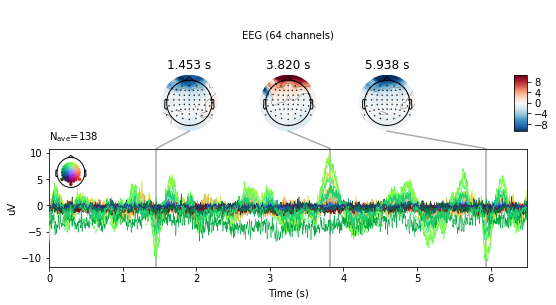

In [34]:
print('Average Gamma band 30-75 Hz in simulated N-back data')
gamma_sim.average().plot_joint();

print('Average Gamma band 30-75 Hz in N-back data')
gamma_data.average().plot_joint();
gamma_diff = mne.combine_evoked([gamma_data.average(), -gamma_sim.average()],
                                weights="equal")
print('The difference between the simulated and real data')
gamma_diff.copy().crop(0, None).plot_joint();


In [ ]:
#Plotting the sensors

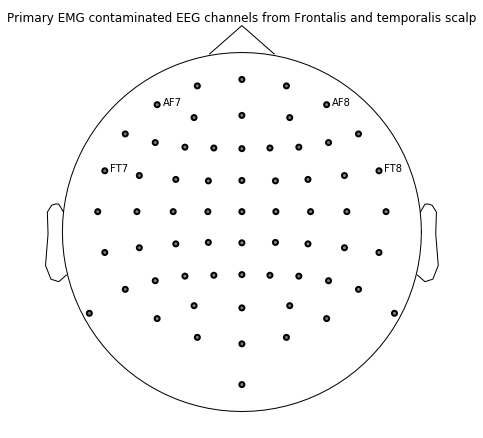

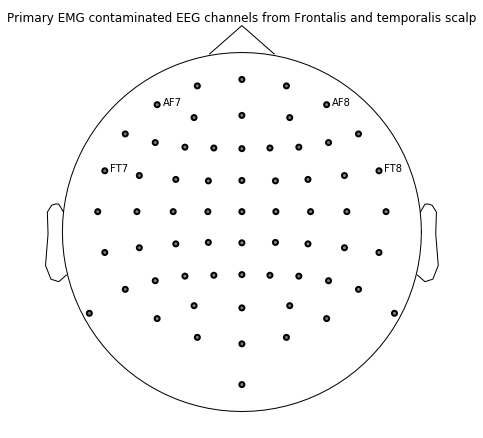

In [72]:
raw.plot_sensors(kind='topomap', ch_type='eeg', 
                 title='Primary EMG contaminated EEG channels from Frontalis and temporalis scalp',
                 show_names=['AF7','AF8','FT7','FT8'], ch_groups='position', to_sphere=True, axes=None, 
                 block=False, show=True)

## Power Spectreal Density of the simulate Gamma band data in the 45-70 Hz frequency band

Power spectral density of simulated N-back data
    Using multitaper spectrum estimation with 7 DPSS windows


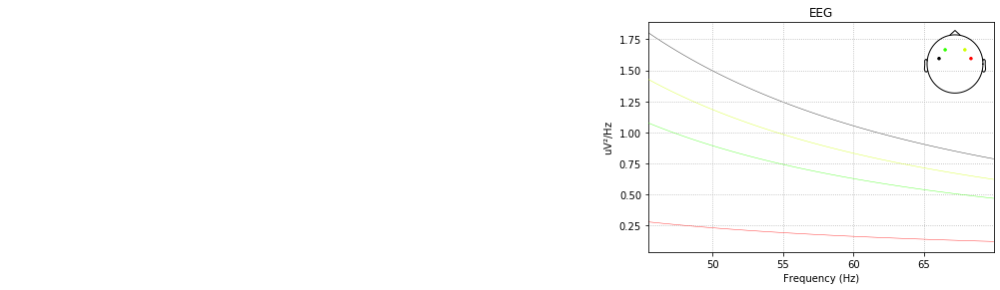

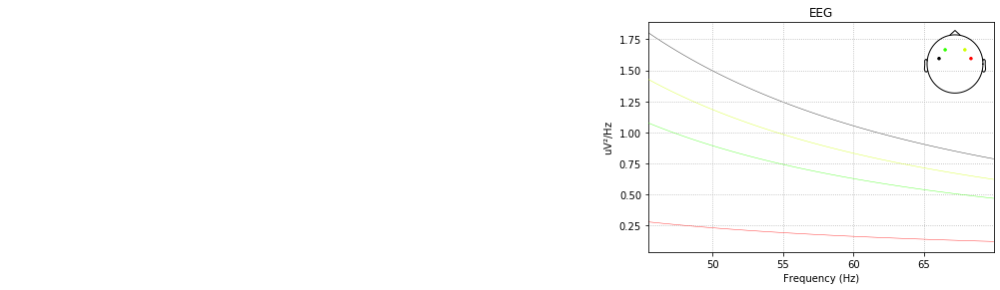

In [44]:
# Power unit is amplitude ^2/Hz so db=False, estimate ='power'or 'auto'
# Power unit is amplitude ^2/Hz(decibel) so db=True, estimate ='power'or 'auto'
print("Power spectral density of simulated N-back data")
gamma_sim.plot_psd(fmin = 45,fmax = 70, tmin = 0, tmax = 2,spatial_colors =True,average = False,
                  picks = ['AF7','AF8','FT7','FT8'], dB = False, estimate ='power') 


In [ ]:
#PSD of gamma band real data

Power spectral density of the N-back data of the first epoch of 2 seconds.
Showing the effect of frontalis muscle effect
    Using multitaper spectrum estimation with 7 DPSS windows


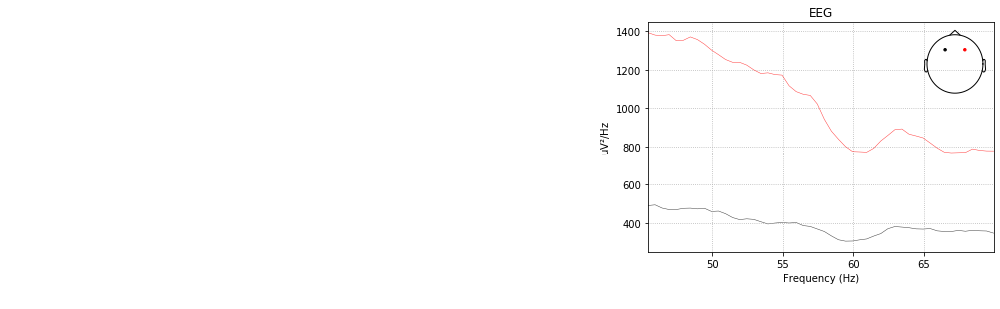

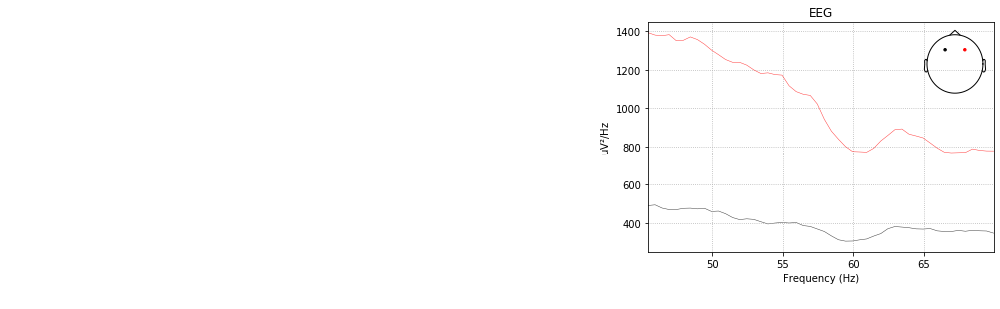

In [45]:
print("Power spectral density of the N-back data of the first epoch of 2 seconds.")
print("Showing the effect of frontalis muscle effect")
gamma_data.plot_psd(fmin = 45,fmax = 70, tmin = 0, tmax = 2,spatial_colors =True,average = False,
                  picks = ['AF7','AF8'], dB = False, estimate ='power')  

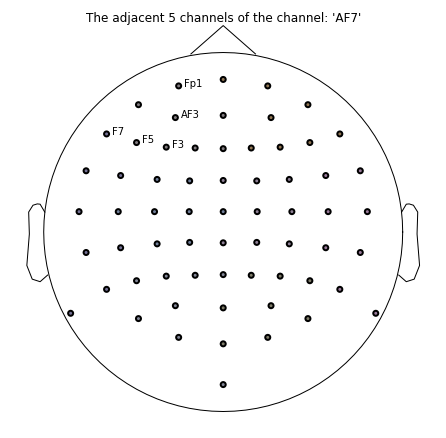

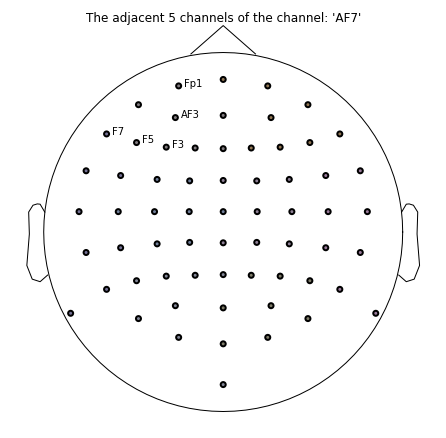

In [73]:
raw.plot_sensors(kind='topomap', ch_type='eeg', 
                 title="The adjacent 5 channels of the channel: 'AF7'",
                 show_names=['Fp1', 'AF3', 'F3', 'F5', 'F7'], ch_groups='position', to_sphere=True, axes=None, 
                 block=False, show=True)

Power spectral density of the  5 adjacent channels of the channel: 'AF7'
    Using multitaper spectrum estimation with 7 DPSS windows


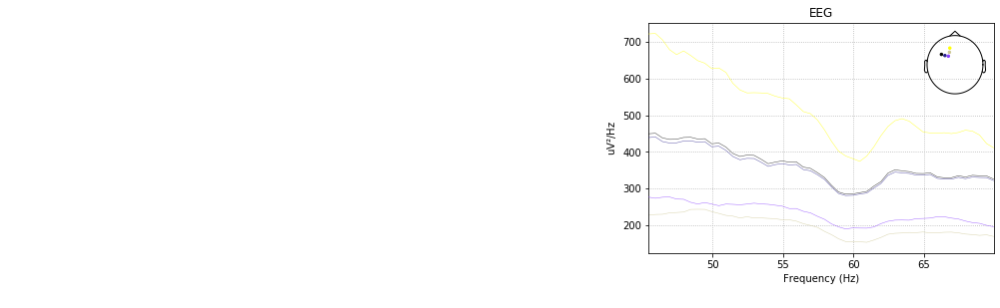

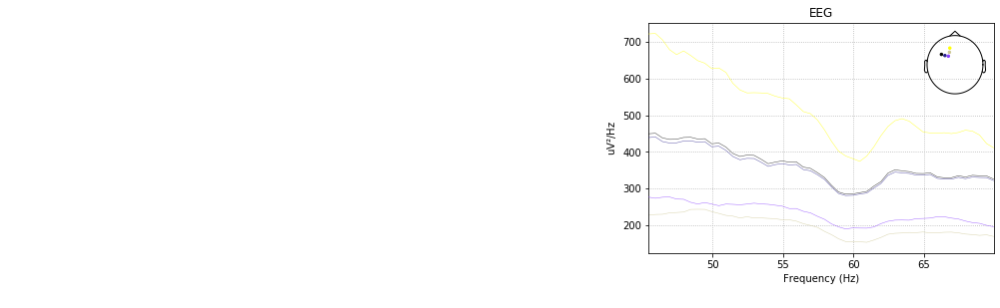

In [74]:
print("Power spectral density of the  5 adjacent channels of the channel: 'AF7'")
gamma_data.plot_psd(fmin = 45,fmax = 70, tmin = 0, tmax = 2,spatial_colors =True,average = False,
                  picks = ['Fp1', 'AF3', 'F3', 'F5', 'F7'], dB = False, estimate ='power') 

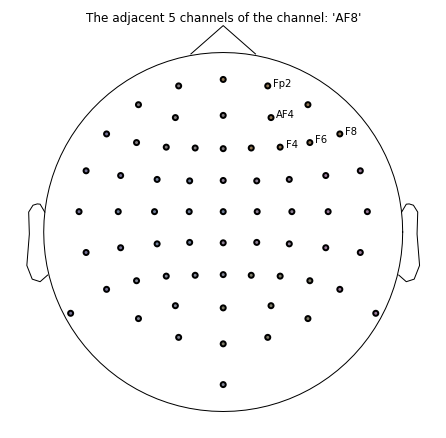

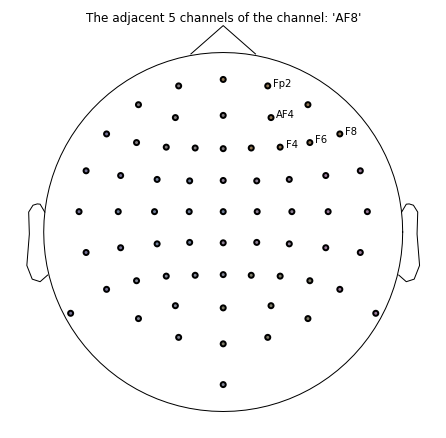

In [75]:
raw.plot_sensors(kind='topomap', ch_type='eeg', 
                 title="The adjacent 5 channels of the channel: 'AF8'",
                 show_names=['Fp2', 'AF4', 'F4', 'F6', 'F8'], ch_groups='position', to_sphere=True, axes=None, 
                 block=False, show=True)

Power spectral density of the adjacent channels of the channel: 'AF8'
    Using multitaper spectrum estimation with 7 DPSS windows


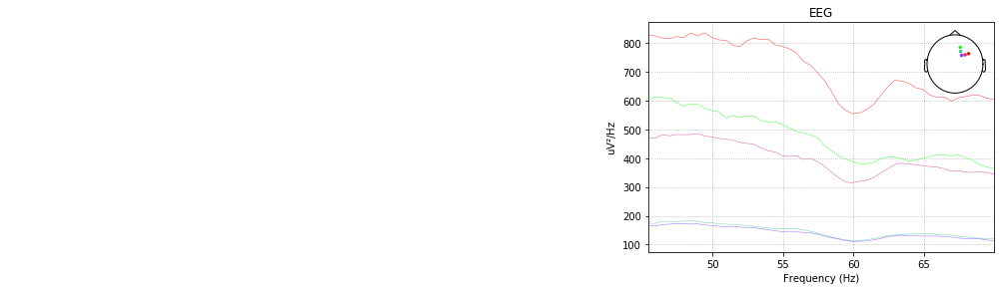

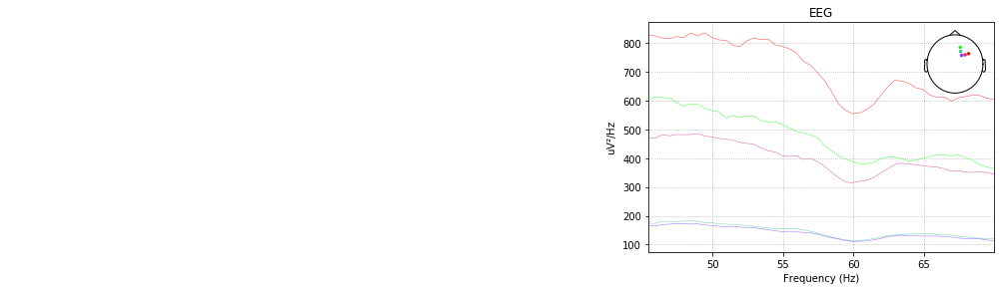

In [58]:
print("Power spectral density of the adjacent channels of the channel: 'AF8'")
gamma_data.plot_psd(fmin = 45,fmax = 70, tmin = 0, tmax = 2,spatial_colors =True,average = False,
                  picks = ['Fp2', 'AF4', 'F4', 'F6', 'F8'], dB = False, estimate ='power') 

Power spectral density of the N-back data of the first epoch of 2 seconds.
Showing the effect of temporalis muscle effect
    Using multitaper spectrum estimation with 7 DPSS windows


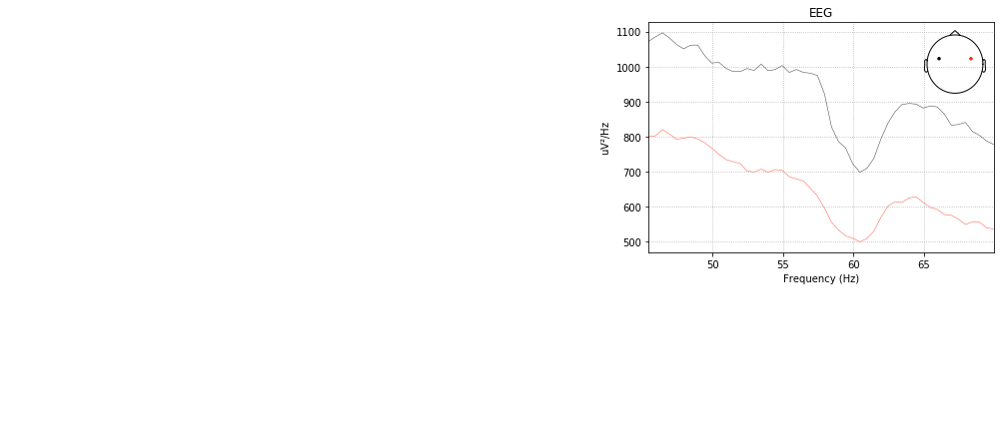

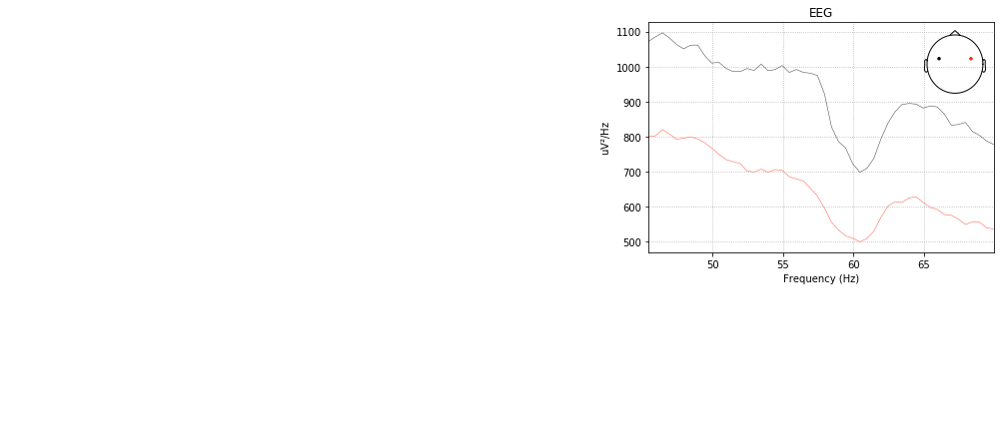

In [46]:
print("Power spectral density of the N-back data of the first epoch of 2 seconds.")
print("Showing the effect of temporalis muscle effect")
gamma_data.plot_psd(fmin = 45,fmax = 70, tmin = 0, tmax = 2,spatial_colors=True, average = False,
                   picks = ['FT7','FT8'], dB = False, estimate ='power')

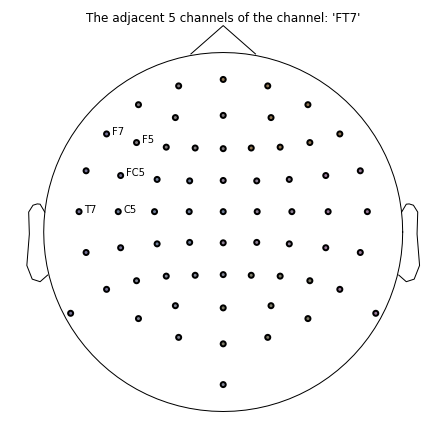

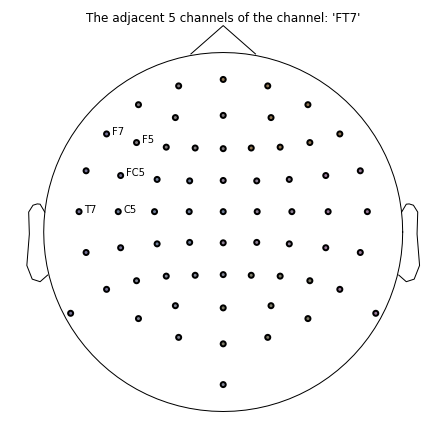

In [76]:
raw.plot_sensors(kind='topomap', ch_type='eeg', 
                 title="The adjacent 5 channels of the channel: 'FT7'",
                 show_names=['F7', 'F5', 'FC5', 'C5', 'T7'], ch_groups='position', to_sphere=True, axes=None, 
                 block=False, show=True)

Power spectral density of the  5 adjacent channels of the channel: 'FT7'
    Using multitaper spectrum estimation with 7 DPSS windows


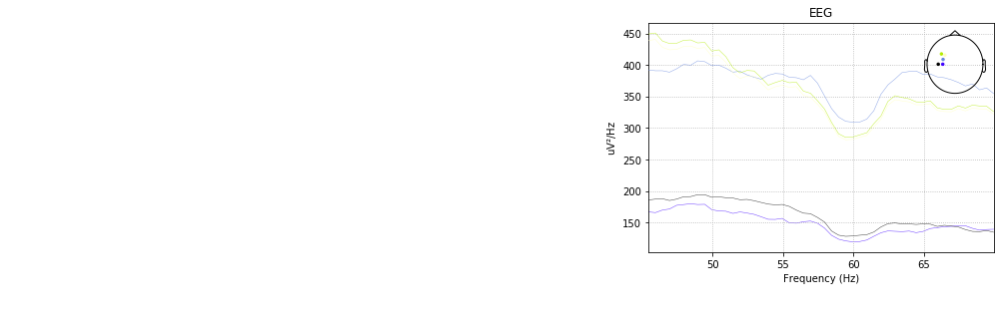

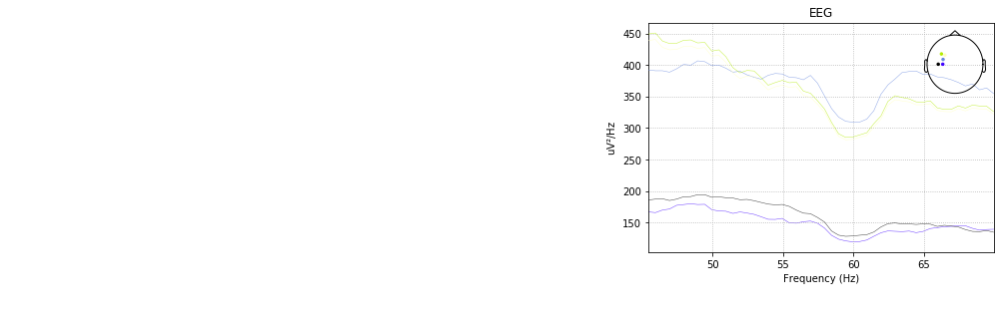

In [77]:
print("Power spectral density of the  5 adjacent channels of the channel: 'FT7'")
gamma_data.plot_psd(fmin = 45,fmax = 70, tmin = 0, tmax = 2,spatial_colors =True,average = False,
                  picks = ['F7', 'F5', 'FC5', 'C5', 'T7'], dB = False, estimate ='power')

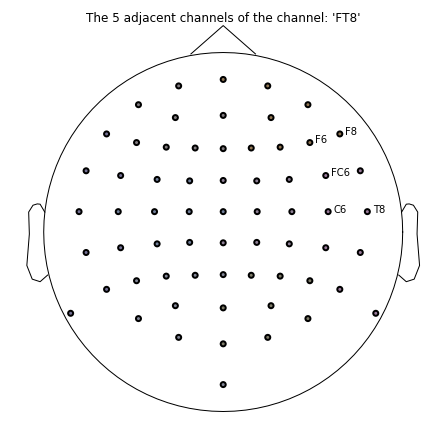

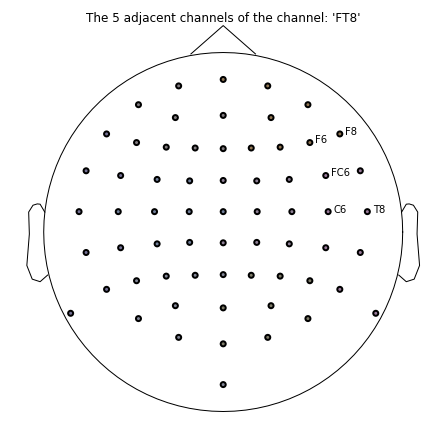

In [78]:
raw.plot_sensors(kind='topomap', ch_type='eeg', 
                 title="The 5 adjacent channels of the channel: 'FT8'",
                 show_names=['F8', 'F6', 'FC6', 'C6', 'T8'], ch_groups='position', to_sphere=True, axes=None, 
                 block=False, show=True)

Power spectral density of the adjacent channels of the channel: 'FT8'
    Using multitaper spectrum estimation with 7 DPSS windows


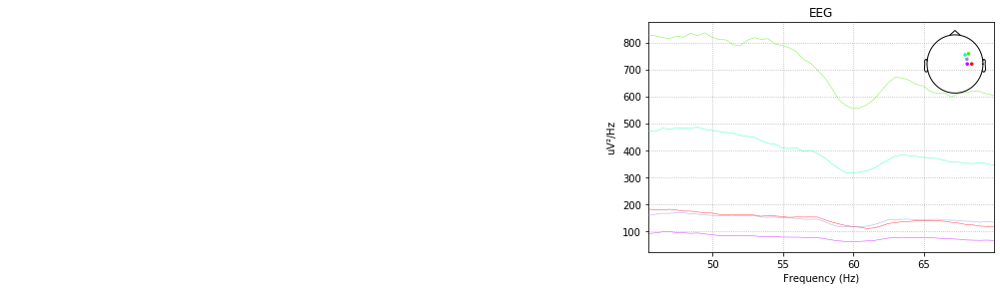

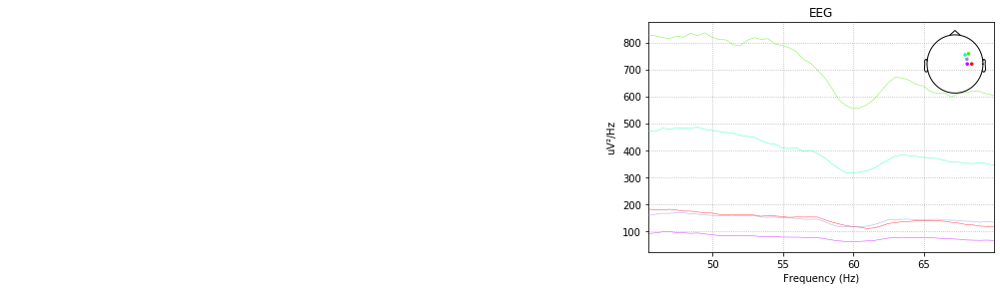

In [63]:
print("Power spectral density of the adjacent channels of the channel: 'FT8'")
gamma_data.plot_psd(fmin = 45,fmax = 70, tmin = 0, tmax = 2,spatial_colors =True,average = False,
                  picks = ['F8', 'F6', 'FC6', 'C6', 'T8'], dB = False, estimate ='power')

In [ ]:
theta_data = frequency_map[0][1]
theta_sim = sd.make_sim_data(theta_data, order=17)
alpha_data = frequency_map[1][1]
alpha_sim = sd.make_sim_data(alpha_data, order=17)
beta_data = frequency_map[2][1]
beta_sim = sd.make_sim_data(beta_data, order=17)

## Theta

Average Theta band 4-7 Hz in simulated N-back data


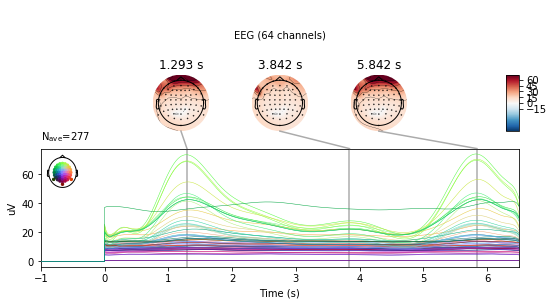

Average Theta band 4-7 Hz in N-back data


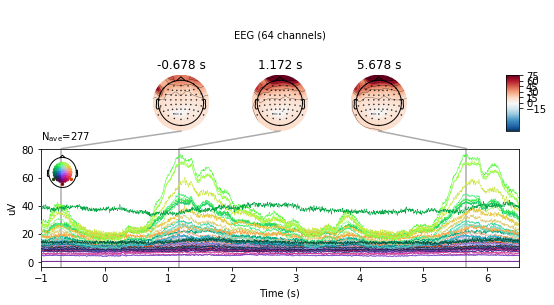

The difference between the simuled and real data


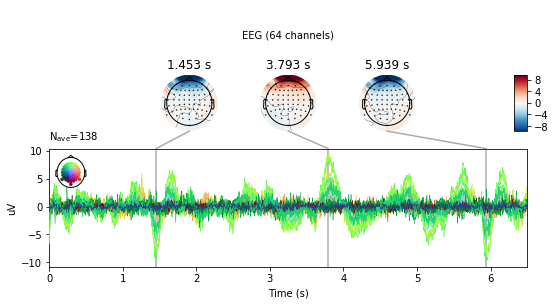

In [31]:
print('Average Theta band 4-7 Hz in simulated N-back data')
theta_sim.average().plot_joint();
print('Average Theta band 4-7 Hz in N-back data')
theta_data.average().plot_joint();
theta_diff = mne.combine_evoked([theta_data.average(), -theta_sim.average()],
                                 weights="equal")
print('The difference between the simuled and real data')
theta_diff.copy().crop(0, None).plot_joint();

## Alpha band


Average Alpha band 8-12 Hz in simulated N-back data


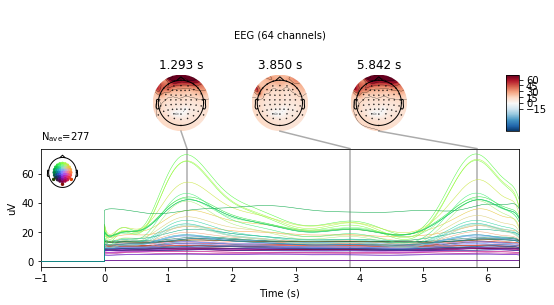

Average Aplha band 8-12 Hz in N-back data


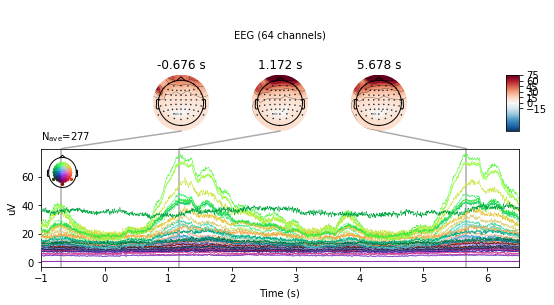

The difference between the simuled and real data


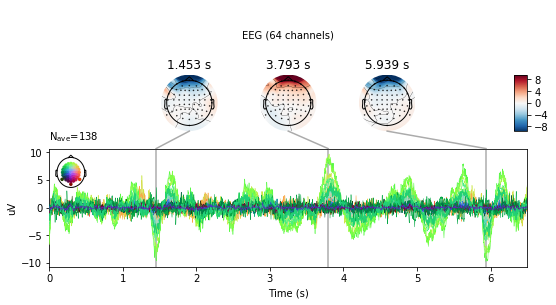

In [32]:
print('Average Alpha band 8-12 Hz in simulated N-back data')
alpha_sim.average().plot_joint();
print('Average Aplha band 8-12 Hz in N-back data')
alpha_data.average().plot_joint();

alpha_diff = mne.combine_evoked([alpha_data.average(), -alpha_sim.average()],
                                weights="equal")
print('The difference between the simuled and real data')
alpha_diff.copy().crop(0, None).plot_joint();

## Beta band

Average Beta band 13-25 Hz in simulated N-back data


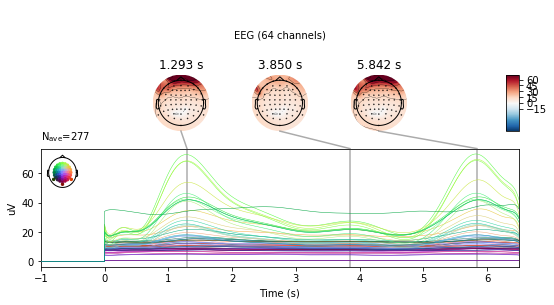

Average Beta band 13-25 Hz in N-back data


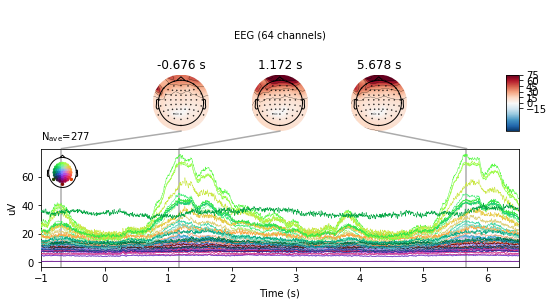

The difference between the simuled and real data


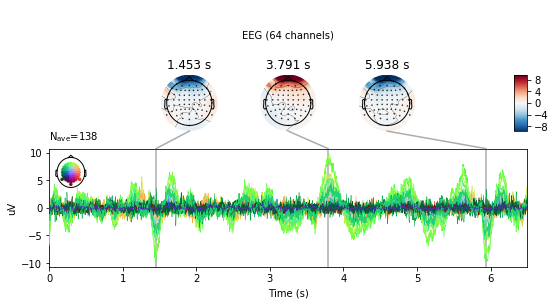

In [33]:
print('Average Beta band 13-25 Hz in simulated N-back data')
beta_sim.average().plot_joint();
print('Average Beta band 13-25 Hz in N-back data')
beta_data.average().plot_joint();
beta_diff = mne.combine_evoked([beta_data.average(), -beta_sim.average()],
                               weights="equal")
print('The difference between the simuled and real data')
beta_diff.copy().crop(0, None).plot_joint();